<a href="https://colab.research.google.com/github/bimaadiwijaya8/PCVK26_05_BimaAdiwijaya/blob/main/P2/Pertanyaan_Praktikum.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from skimage import io

img_path = "20260903_144111.jpg"

img = cv2.imread(img_path)

print("Shape:", img.shape)
print("Dtype:", img.dtype)

Shape: (1441, 2317, 3)
Dtype: uint8


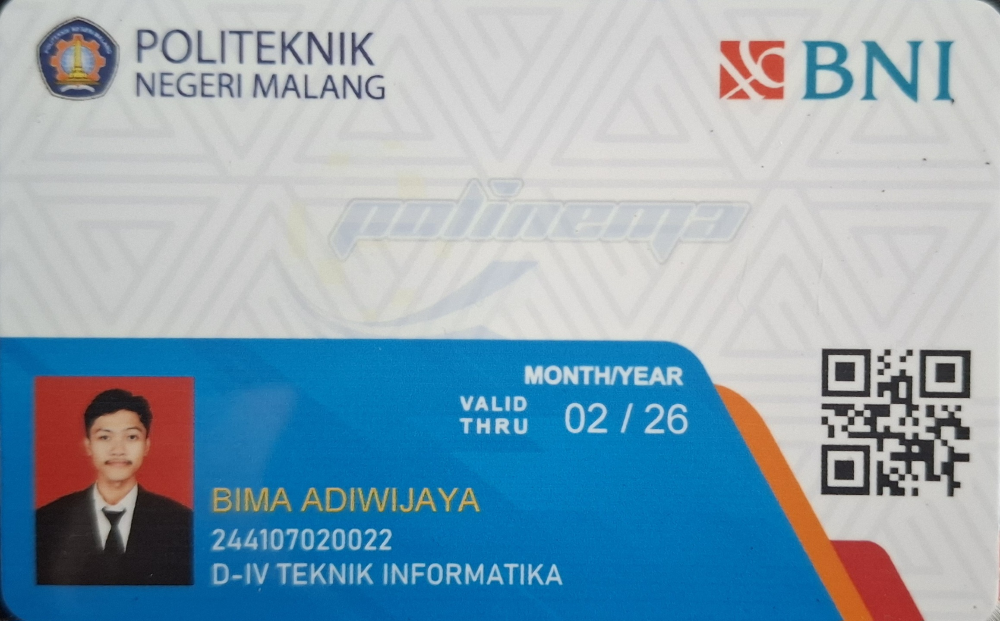

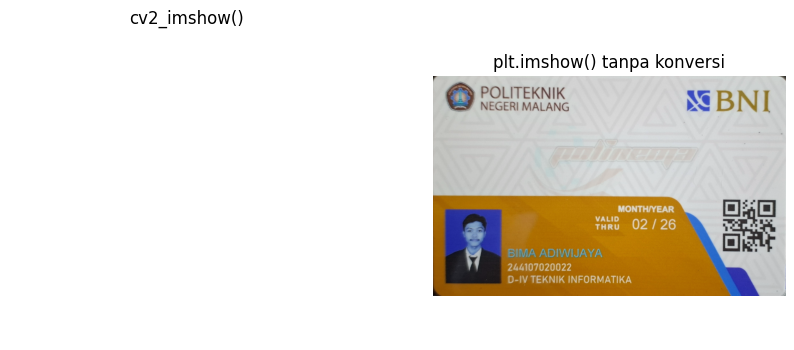

Koordinat piksel: (100, 100)
Nilai piksel dari cv2.imread() [B, G, R]: [75 59 53]
Nilai yang diinterpretasikan matplotlib [R, G, B]: [53 59 75]


In [ ]:
img = cv2.imread(img_path)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
cv2_imshow(img)
plt.title("cv2_imshow()")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img)
plt.title("plt.imshow() tanpa konversi")
plt.axis("off")

plt.show()

y, x = 100, 100

print("Koordinat piksel:", (y, x))
print("Nilai piksel dari cv2.imread() [B, G, R]:", img[y, x])
print("Nilai yang diinterpretasikan matplotlib [R, G, B]:", img[y, x][::-1])

### Jawaban

Hasil tampilan `cv2_imshow()` dan `plt.imshow()` berbeda walaupun menggunakan citra yang sama. Hal ini disebabkan oleh perbedaan urutan kanal warna.

OpenCV menggunakan urutan kanal BGR (Blue, Green, Red), sedangkan Matplotlib menginterpretasikan citra berwarna dengan urutan RGB (Red, Green, Blue). Oleh karena itu, ketika citra hasil `cv2.imread()` langsung diberikan kepada `plt.imshow()` tanpa konversi warna, kanal merah dan biru tertukar sehingga warna citra terlihat berbeda.

Perbedaan tersebut dapat dibuktikan melalui nilai piksel yang dicetak oleh program. Nilai piksel dari OpenCV dibaca dalam urutan BGR, sedangkan Matplotlib menginterpretasikan tiga nilai tersebut sebagai RGB. Dengan demikian, perbedaan warna bukan disebabkan oleh perubahan nilai piksel, tetapi oleh perbedaan interpretasi urutan kanal warna.

In [ ]:
height, width = img.shape[:2]

black_int16 = np.zeros((height, width, 3), dtype=np.int16)
black_int32 = np.zeros((height, width, 3), dtype=np.int32)

print("=== INT16 ===")
print("Shape :", black_int16.shape)
print("Dtype :", black_int16.dtype)
print("Min   :", black_int16.min())
print("Max   :", black_int16.max())
print("nbytes:", black_int16.nbytes)

print("\n=== INT32 ===")
print("Shape :", black_int32.shape)
print("Dtype :", black_int32.dtype)
print("Min   :", black_int32.min())
print("Max   :", black_int32.max())
print("nbytes:", black_int32.nbytes)

print("\nPerbandingan ukuran memori:")
print("int32 / int16 =", black_int32.nbytes / black_int16.nbytes)

=== INT16 ===
Shape : (1441, 2317, 3)
Dtype : int16
Min   : 0
Max   : 0
nbytes: 20032782

=== INT32 ===
Shape : (1441, 2317, 3)
Dtype : int32
Min   : 0
Max   : 0
nbytes: 40065564

Perbandingan ukuran memori:
int32 / int16 = 2.0


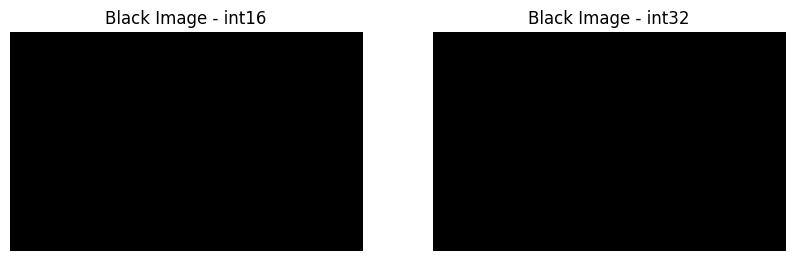

In [ ]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(black_int16)
plt.title("Black Image - int16")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(black_int32)
plt.title("Black Image - int32")
plt.axis("off")

plt.show()

### Jawaban

Kedua kanvas menghasilkan tampilan hitam karena seluruh nilai pikselnya dibuat menjadi nol. Jadi, secara visual tidak terdapat perbedaan warna antara citra dengan tipe data int16 dan int32.

Perbedaannya terdapat pada tipe data dan penggunaan memori. int16 menggunakan jumlah bit yang lebih kecil dibandingkan int32, sedangkan int32 memiliki ukuran data per elemen yang lebih besar. Akibatnya, untuk ukuran citra yang sama, citra dengan tipe data int32 membutuhkan memori lebih besar.

Nilai dtype, min(), max(), dan nbytes dari kedua citra dapat dilihat langsung pada keluaran program di atas. Nilai min dan max sama karena seluruh piksel pada kedua citra bernilai nol.

### Jawaban

Baris `from google.colab.patches import cv2_imshow` digunakan untuk mengimpor fungsi `cv2_imshow()` yang disediakan khusus untuk menampilkan citra OpenCV pada lingkungan Google Colab.

Pada komputer lokal, OpenCV biasanya dapat menggunakan `cv2.imshow()` untuk membuat jendela baru yang menampilkan gambar. Namun, Google Colab berjalan pada lingkungan notebook berbasis browser dan tidak memiliki GUI desktop seperti komputer lokal. Oleh karena itu, `cv2.imshow()` tidak dapat digunakan secara normal di Google Colab.

Sebagai gantinya, Google Colab menyediakan `cv2_imshow()` agar citra dari OpenCV dapat ditampilkan langsung di dalam output notebook.

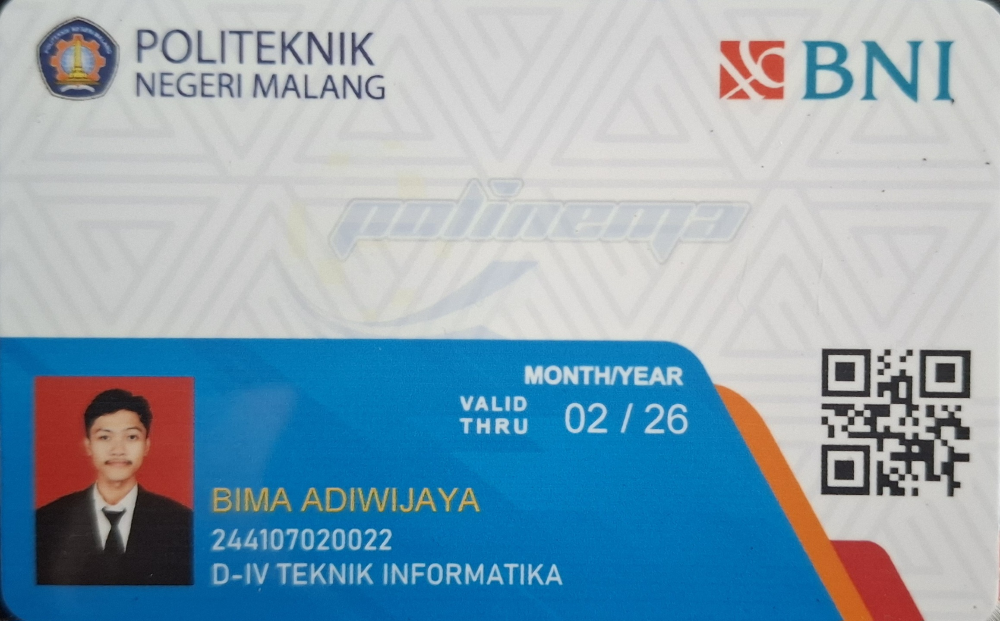

In [ ]:
from google.colab.patches import cv2_imshow

cv2_imshow(img)

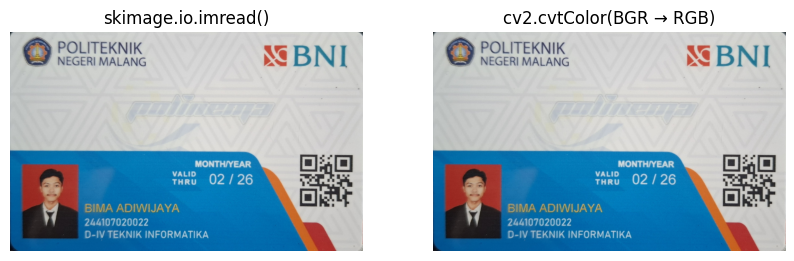

Koordinat piksel: (100, 100)
skimage.io.imread() [R, G, B]: [53 59 75]
cv2.imread() sebelum konversi [B, G, R]: [75 59 53]
cv2.cvtColor() setelah konversi [R, G, B]: [53 59 75]

Apakah nilai RGB keduanya sama? True


In [ ]:
img_skimage = io.imread(img_path)

img_cv = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(img_skimage)
plt.title("skimage.io.imread()")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(img_rgb)
plt.title("cv2.cvtColor(BGR → RGB)")
plt.axis("off")

plt.show()

y, x = 100, 100

print("Koordinat piksel:", (y, x))
print("skimage.io.imread() [R, G, B]:", img_skimage[y, x])
print("cv2.imread() sebelum konversi [B, G, R]:", img_cv[y, x])
print("cv2.cvtColor() setelah konversi [R, G, B]:", img_rgb[y, x])

print("\nApakah nilai RGB keduanya sama?",
      np.array_equal(img_skimage[y, x], img_rgb[y, x]))

### Jawaban

`skimage.io.imread()` pada citra berwarna membaca kanal dalam urutan RGB. Sementara itu, `cv2.imread()` membaca citra dalam urutan BGR.

Pada program di atas, hasil `cv2.imread()` kemudian dikonversi menggunakan `cv2.cvtColor()` dari BGR menjadi RGB. Oleh karena itu, hasil akhirnya seharusnya memiliki urutan kanal yang sama dengan hasil pembacaan menggunakan `skimage.io.imread()`.

Berdasarkan nilai piksel yang dicetak program, hasil `skimage.io.imread()` dan hasil `cv2.cvtColor()` dapat dibandingkan secara langsung. Jika nilai RGB keduanya sama, berarti keduanya menampilkan warna sebenarnya.

Jadi, `skimage.io.imread()` dan `cv2.cvtColor(img, cv2.COLOR_BGR2RGB)` sama-sama menghasilkan citra dengan urutan kanal RGB. Kanal tertukar terjadi pada citra hasil `cv2.imread()` apabila langsung ditampilkan menggunakan Matplotlib tanpa konversi.

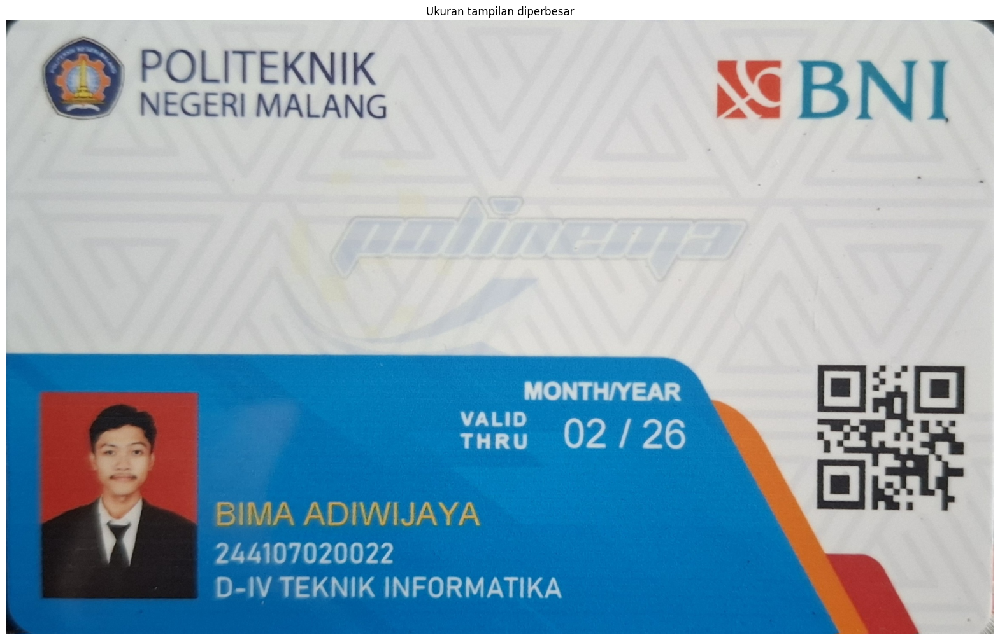

Shape sebelum: (1441, 2317, 3)
Shape sesudah: (1441, 2317, 3)
Apakah shape berubah? False


In [ ]:
shape_awal = img.shape

plt.figure(figsize=(20, 15))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Ukuran tampilan diperbesar")
plt.axis("off")
plt.show()

shape_akhir = img.shape

print("Shape sebelum:", shape_awal)
print("Shape sesudah:", shape_akhir)
print("Apakah shape berubah?", shape_awal != shape_akhir)

### Jawaban

Mengubah `figsize` hanya mengubah ukuran citra ketika ditampilkan pada figure Matplotlib. Perubahan tersebut tidak mengubah ukuran atau jumlah piksel pada citra asli.

Hal ini dapat dibuktikan dengan membandingkan `img.shape` sebelum dan sesudah citra ditampilkan menggunakan `figsize` yang lebih besar. Berdasarkan keluaran program, shape citra tetap sama.

Jadi, mengubah ukuran tampilan berbeda dengan mengubah ukuran citra. `figsize` hanya mengatur ukuran area tampilan, sedangkan perubahan ukuran citra dilakukan menggunakan operasi seperti `cv2.resize()`.

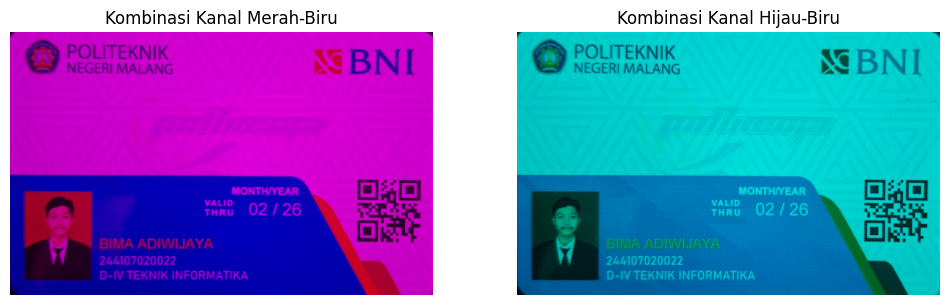

In [ ]:
img_bgr = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

red = img_rgb[:, :, 0]
green = img_rgb[:, :, 1]
blue = img_rgb[:, :, 2]

red_blue = np.zeros_like(img_rgb)
red_blue[:, :, 0] = red
red_blue[:, :, 2] = blue

green_blue = np.zeros_like(img_rgb)
green_blue[:, :, 1] = green
green_blue[:, :, 2] = blue

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(red_blue)
plt.title("Kombinasi Kanal Merah-Biru")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(green_blue)
plt.title("Kombinasi Kanal Hijau-Biru")
plt.axis("off")

plt.show()

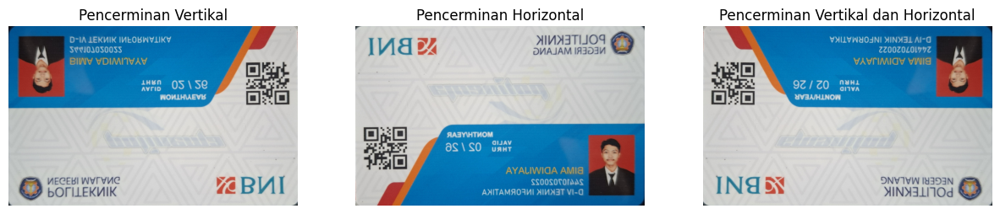

In [ ]:
img_rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

vertical = cv2.flip(img_rgb, 0)
horizontal = cv2.flip(img_rgb, 1)
both = cv2.flip(img_rgb, -1)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(vertical)
plt.title("Pencerminan Vertikal")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(horizontal)
plt.title("Pencerminan Horizontal")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(both)
plt.title("Pencerminan Vertikal dan Horizontal")
plt.axis("off")

plt.show()

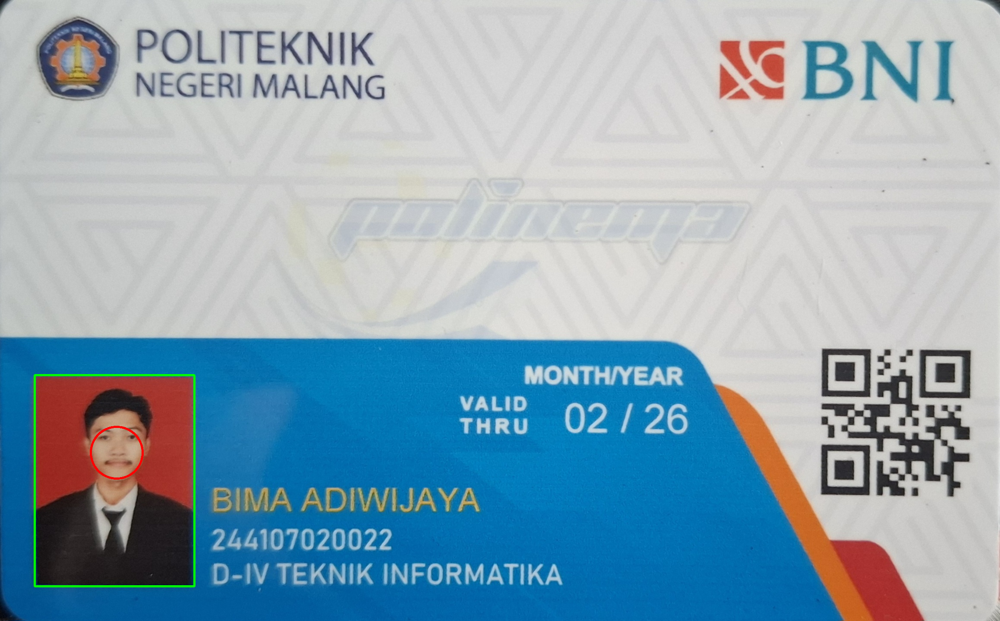

In [ ]:
img = cv2.imread("20260903_144111.jpg")

cv2.rectangle(img, (80, 870), (450, 1360), (0, 255, 0), 3)

cv2.circle(img, (270, 1050), 60, (0, 0, 255), 3)

cv2_imshow(img)